This was my first time making a classifier for cats and dogs.

I used and applied what I learned from Secure and private AI course. This notebook is a little updated from then on.

First I download the data.

In [0]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_3367a.zip

Then unzip the data

In [0]:
!unzip kagglecatsanddogs_3367a.zip

Import neccessary packages

In [0]:
%matplotlib inline

import matplotlib.pyplot as plt
import torchvision
import torch
from torchvision import datasets, transforms, models
from torch import nn
from torch import optim

In [0]:
import glob
import warnings
import os
from tqdm import tqdm_notebook as tqdm_nb

cats = glob.glob('PetImages/Cat/*.jpg')
dogs = glob.glob('PetImages/Dog/*.jpg')
# Initially there are 12500 photos of each
type(cats), len(cats), type(dogs), len(dogs)

(list, 12500, list, 12500)

I did a lot of experimentation with UserWarning and OSError. What I found is as follows:

--You need to get rid of files with `OSError`, they will raise errors and halt your model.

--Python Imaging Library throws UserWarning for images it things are corrupted, they won't raise errors and halt the model but they can be irritating since they will show up on the console and mess up the results. Also the UserWarnings that PIL will throw somehow are shown only in the first epoch. There will be two kinds of UserWarning that PIL will throw - `Possibly corrupt EXIF data` or `Corrupt EXIF data`. 
There are following ways to get rid of them:

--Do `warnings.filterwarnings('error')` and these will turn the UserWarning -  Corrupt EXIF data, to error and then you can delete the files which show these errors and after doing this, the `UserWarning - Possible corrupt EXIF data` ones also don't show.

--Do `warnings.filterwarnings('ignore')` - this just ignores all warnings but a little better approach would be just to ignore the warnings that bother us.
BY doing `warnings.filterwarnngs('ignore', '')`

Also EXIF - Exchangeable Image FIle Format

In [0]:
pets = [cats, dogs]
for pet in pets:
    for ii in pet:
        try:
            plt.imread(ii)
        except (OSError):
            os.remove(ii)
            print(ii, 'is removed')

cats = glob.glob('PetImages/Cat/*.jpg')
dogs = glob.glob('PetImages/Dog/*.jpg')

In [0]:
warnings.filterwarnings("ignore", "(Possibly )?corrupt EXIF data", UserWarning)

In [0]:
# This one is for deleting the one with UserWarning too

# warnings.filterwarnings('error')
# for pet in pets:
#     for ii in pet:
#         try:
#             plt.imread(ii)
#         except (UserWarning, OSError):
#             os.remove(ii)
#             print(ii, 'is removed')

# cats = glob.glob('PetImages/Cat/*.jpg')
# dogs = glob.glob('PetImages/Dog/*.jpg')

In [0]:
# Make the transforms

train_transforms = transforms.Compose([transforms.RandomRotation(30),
                                     transforms.RandomResizedCrop(224),
                                     transforms.RandomHorizontalFlip(),
                                     transforms.ToTensor(),
                                     transforms.Normalize([0.485, 0.456, 0.406],
                                                          [0.229, 0.224, 0.225])])

# test_transforms = transforms.Compose([transforms.Resize(225),
#                                     transforms.CenterCrop(224),
#                                     transforms.ToTensor(),
#                                     transforms.Normalize([0.485, 0.456, 0.406],
#                                                         [0.229, 0.224, 0.225])])

Here I am using `train_transforms` for both train and test, not a standard practice but I think it's not gonna make much of a difference.

In [0]:
?transforms.RandomResizedCrop

In [0]:
?transforms.Resize

In [0]:
?transforms.CenterCrop

In [0]:
?transforms.RandomRotation

In [0]:
?transforms.Normalize

In [0]:
train_len = int((len(cats) + len(dogs))*0.8)
test_len = len(cats) + len(dogs) - train_len
# Get the dataset from the folder and the labels as well
CatvsDog = datasets.ImageFolder('PetImages', transform = train_transforms)
train_dataset, test_dataset = torch.utils.data.random_split(CatvsDog, [train_len, test_len])

In [0]:
?datasets.ImageFolder

By the way `datasets.ImageFolder` also contains an arugument that takes in a function that will have to check for the validity of files. It's called `is_valid_file`. 

In [0]:
train_len, test_len, type(train_len), type(test_len)

(19998, 5000, int, int)

In [0]:
trainloader = torch.utils.data.DataLoader(train_dataset, batch_size = 64,
                                          shuffle = True)
testloader = torch.utils.data.DataLoader(test_dataset, batch_size = 64)

In [0]:
model = models.densenet121(pretrained = True)

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:01<00:00, 25.6MB/s]


In [0]:
for param in model.parameters():
    param.requires_grad = False # Turn off gradients for convolutional part


from collections import OrderedDict

classifier = nn.Sequential(OrderedDict([('fc1',nn.Linear(1024, 500)),
                                       ('relu',nn.ReLU()),
                                       ('fc2',nn.Linear(500, 2)),
                                       ('output',nn.LogSoftmax(dim = 1))]))
model.classifier = classifier

In [0]:
import time

Showing the difference between training time in CPU vs GPU.

In [0]:
for device in ['cpu', 'cuda']:
    criterion = nn.NLLLoss()
    optimizer = optim.Adam(model.classifier.parameters(), lr = 0.001)
    
    model.to(device)
    
    for ii, (inputs, labels) in enumerate(trainloader):
        inputs, labels = inputs.to(device), labels.to(device)
        
        start = time.time()
        
        outputs = model.forward(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        if ii ==3:
            break
                
    print(f'Device = {device}; Time per batch:{(time.time() - start)/3:.3f} seconds')

Device = cpu; Time per batch:4.253 seconds
Device = cuda; Time per batch:0.007 seconds


In [0]:
# Making a function for the model training

def model_train(model:model, optimizer:optimizer):
    criterion = nn.NLLLoss()
    device = 'cuda'
    model.to(device)
    epochs = 1
    print_every = 20
    print_every_train_loss = 0
    for _ in tqdm_nb(range(epochs)):
        train_loss = 0
        for ii, (images, labels) in enumerate(trainloader):
            optimizer.zero_grad()
            images, labels = images.to(device), labels.to(device)
            log_probs = model.forward(images)
            loss = criterion(log_probs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            print_every_train_loss += loss.item()
            if (ii+1)%print_every == 0:
                print(f'print every loss: {print_every_train_loss/print_every}')
                print_every_train_loss = 0
        else:
            model.eval() # Set in evaluation mode
            test_loss = 0
            accuracy = 0
            print_every_test_loss = 0
            print_every_accuracy = 0
            for ii, (test_images, test_labels) in enumerate(testloader):    
                test_images, test_labels = test_images.to(device), test_labels.to(device)
                log_probs = model.forward(test_images)
                loss = criterion(log_probs, test_labels)
                test_loss += loss.item() # This returns loss as a normal python float
                probs = torch.exp(log_probs)
                topk_values, topk_index = probs.topk(1, dim=1)# as dim 0 is the batches
                equals = topk_index == test_labels.view(*topk_index.shape)# Getting the number of correct predicted test images
                batch_accuracy = torch.mean(equals.type(torch.FloatTensor)).item()
                accuracy += batch_accuracy
                print_every_test_loss += loss.item()
                print_every_accuracy += batch_accuracy
                if (ii+1)%print_every == 0:
                    print(f'Print every loss{print_every_test_loss/print_every} Print every accuracy {print_every_accuracy/print_every}')
                    print_every_test_loss = 0
                    print_every_accuracy = 0
            model.train() # Set in training mode
        print(f'Losses in an epoch\nTrain loss: {train_loss/len(trainloader)} Test loss:{test_loss/len(testloader)} Accuracy:{accuracy/len(testloader)}')

In [0]:
optimizer = optim.Adam(model.classifier.parameters(), lr = 0.0001)
model_train(model, optimizer)

print every loss: 0.19447307251393794
print every loss: 0.16358378604054452
print every loss: 0.17577823549509047
print every loss: 0.1725312788039446
print every loss: 0.15481725260615348
print every loss: 0.14831634275615216
print every loss: 0.1499652024358511
print every loss: 0.17208925485610962
print every loss: 0.14368694350123407
print every loss: 0.13666384369134904
print every loss: 0.14837003238499163
print every loss: 0.15172520466148853
print every loss: 0.1383580459281802
print every loss: 0.14722656197845935
print every loss: 0.1504438031464815
Print every loss0.1165148101747036 Print every accuracy 0.95078125
Print every loss0.13810095004737377 Print every accuracy 0.93984375
Print every loss0.13351771868765355 Print every accuracy 0.94375
Losses in an epoch
Train loss: 0.15576886079800775 Test loss:0.13061764911760257 Accuracy:0.946004746835443



Some inspection...

In [0]:
?model.eval

In [0]:
?model.train

In [0]:
path = './using-densenet121.pth'
torch.save(model.state_dict(), path)

In [0]:
type(cats), len(cats), type(dogs), len(dogs)

In [0]:
ls

In [0]:
model.parameters

Now using resnet 34

In [0]:
model = models.resnet34(pretrained = True)

for param in model.parameters():
    param.requires_grad = False # Turn off gradients for convolutional part

classifier = nn.Sequential(OrderedDict([('fc1',nn.Linear(512, 256)),
                                       ('relu',nn.ReLU()),
                                       ('fc2',nn.Linear(256, 2)),
                                       ('output',nn.LogSoftmax(dim = 1))]))
model.fc = classifier

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:02<00:00, 37.9MB/s]


In [0]:
model.parameters

In [0]:
optimizer = optim.Adam(model.fc.parameters(), lr = 0.0001)
model_train(model, optimizer)

print every loss: 0.5833805739879608
print every loss: 0.4032196208834648
print every loss: 0.30050870403647423
print every loss: 0.2503055542707443
print every loss: 0.2146581806242466
print every loss: 0.2190433196723461
print every loss: 0.18246219381690026
print every loss: 0.17970677241683006
print every loss: 0.16793495118618013
print every loss: 0.16586034707725048
print every loss: 0.16516600511968135
print every loss: 0.14875854291021823
print every loss: 0.14987390749156476
print every loss: 0.14798705391585826
print every loss: 0.14136257097125055
Print every loss0.1323988012969494 Print every accuracy 0.94375
Print every loss0.1300178710371256 Print every accuracy 0.9515625
Print every loss0.13851709738373758 Print every accuracy 0.95
Losses in an epoch
Train loss: 0.22393812272495356 Test loss:0.1413630473462841 Accuracy:0.9434335443037974



In [0]:
path = './using-resnet34.pth'
torch.save(model.state_dict(), path)

Now let's try to show the images

In [0]:
import numpy as np
# Imagenet stats
# mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]

In [0]:
dataiter = iter(trainloader)
images, labels = next(dataiter)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<class 'numpy.ndarray'> (840, 7500, 3)


<Figure size 3600x3600 with 0 Axes>

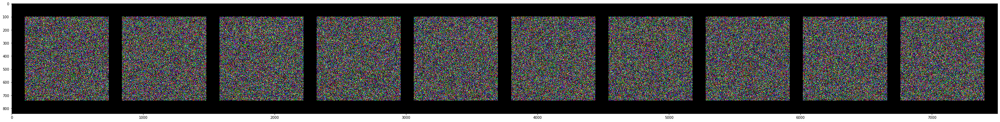

In [0]:
def show(img):
    npimg = img.numpy()
    plt.figure(figsize = (50, 50))
    temp = np.transpose(npimg, (1, 2, 0))
    print(type(temp), temp.shape)
    plt.figure(figsize = (50, 50))
    plt.imshow(temp)

# Showing random images to learn exactly how it happens, PS it shows this example where I saw it :P
w = torch.randn(10,3,640,640)
grid = torchvision.utils.make_grid(w, nrow=10, padding=100)
show(grid)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<class 'numpy.ndarray'> (2940, 1132, 3)


<Figure size 3600x3600 with 0 Axes>

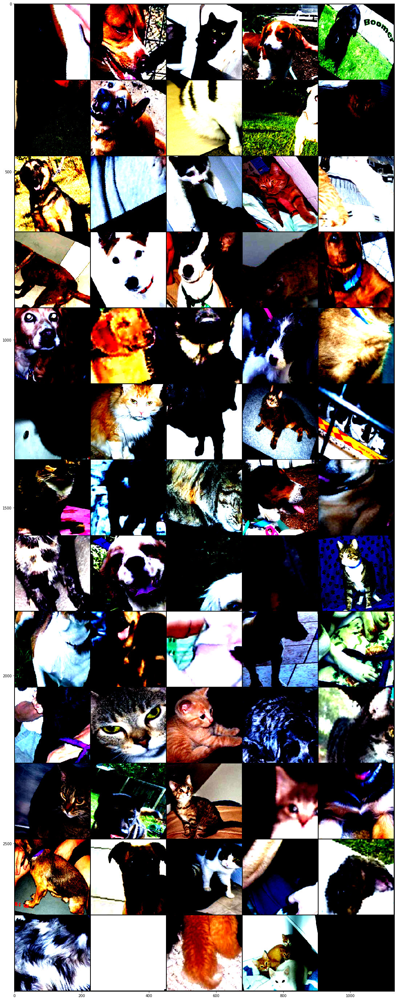

In [0]:
show(torchvision.utils.make_grid(images, nrow = 5, padding = 2))

The above images are normalized, that's why they appear to have so much contrast.

Also, the last images could be blank because one batch size is 64 here and the grid length could not be a factor of that number.

In [0]:
type(images)

torch.Tensor

In [0]:
images.shape

torch.Size([64, 3, 224, 224])

In [0]:
?torchvision.utils.make_grid

In [0]:
?plt.imshow

In [0]:
?np.transpose

In [0]:
print(type(grid), grid.shape)

<class 'torch.Tensor'> torch.Size([3, 840, 7500])


In [0]:
1810*1810

3276100

In [0]:
64*224*224

3211264

In [0]:
64*(224+18)*(224+18)

3748096

In [0]:
64*240*240

3686400

In [0]:
64*230*230

3385600

In [0]:
(224*8 + 18)**2

3276100

Oh yeah!!! Finally understood it!!!

Basically the torch function is taking the no of images in a row and adding the padding value to all the sides of the grid and between all the images and returning it as one image by just appending all the images and the padding and then the plt library is just plotting the whole image as one. 

So in this case nrow was 8 by default and padding was 2 by default so the length = images length + padding length
breadth and length would be same as images are square and rows and columns are equal

So length = 224*8 + 9*2
breadth also = 224*8 + 9*2
total area = length*breadth = (224*8 + 18)**2

Everything is understood, just denormalizing the images is left to see the original images. The images of dogs and cats look weird becuase they are normalized right now which was neccessary becuase it was done in imagenet where densenet and resnet were trained. To look those images we are denormalizing it.

In [0]:
# Imagenet stats
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

def show_denorm(img):
    grid_img = img.numpy()
    grid_img = np.transpose(grid_img, (1, 2, 0))
    
    # Denormalize
    for i in range(3):
        grid_img[:, :, i] *= std[i]
        grid_img[:, :, i] += mean[i]

    plt.figure(figsize = (50, 50))
    plt.imshow(grid_img)

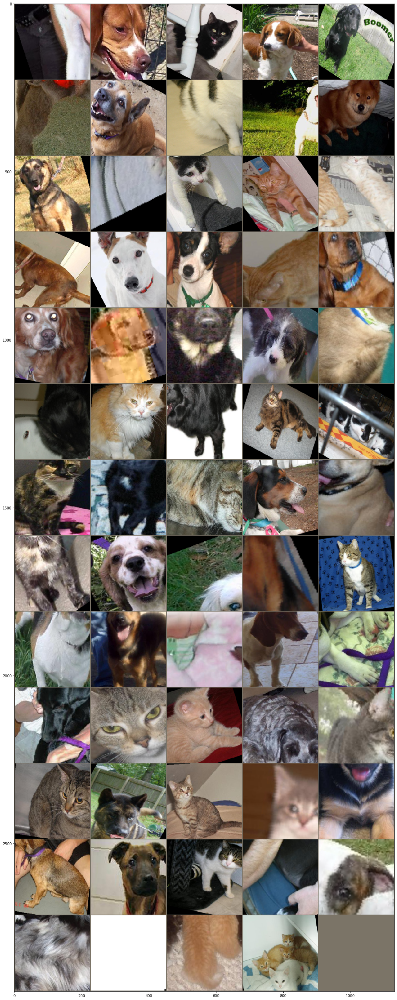

In [0]:
show_denorm(torchvision.utils.make_grid(images, nrow=5, padding=2))

In [0]:
?plt.imshow

I made a silly mistake while trying to normalize the images which took 1 day to understand but during which I learned and did some cool stuff. So it was a learning experience for me.

Will show it by using only one image, since it is easier to understand.

In [0]:
image = images[0]

In [0]:
image = np.array(image)

In [0]:
image = np.transpose(image, [1, 2, 0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


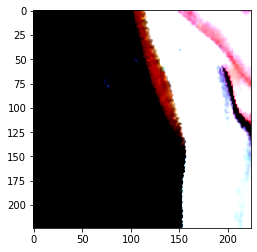

In [0]:
plt.imshow(image)

The above picture is normalized and you can see that most of the part is showing too dark or too white, that's because by normalizing the values have gotten outside of the range of [0, 1].

By normalizing the values have gotten to be as shown in the cell below

In [0]:
print('For red channel: ', 'min: ', -mean[0]/std[0], 'max: ', (1-mean[0])/std[0])
print('For blue channel: ', 'min: ', -mean[1]/std[1], 'max: ', (1-mean[1])/std[1])
print('For green channel: ', 'min: ', -mean[2]/std[2], 'max: ', (1-mean[2])/std[2])

For red channel:  min:  -2.1179039301310043 max:  2.2489082969432315
For blue channel:  min:  -2.0357142857142856 max:  2.428571428571429
For green channel:  min:  -1.8044444444444445 max:  2.6399999999999997


By denormalizing these values will be in the range between 0 and 1 again. 

In [0]:
image_flat = image.flatten()

(array([4568., 4997., 3027., 3164.,  812.,  697., 5605., 2262., 3496.,
        4853., 5191., 4573., 5299., 6830., 4673., 5168., 4305., 2729.,
        3233., 3304., 2996., 1233., 1686., 1453., 1108.,  587.,  580.,
         365.,  181.,  201.,  194.,  169.,  140.,  241.,  263.,  189.,
         375.,  480.,  429.,  317.,  403.,  405.,  328.,  422.,  294.,
         241.,  258.,  226.,  198.,  226.,  194.,  201.,  242.,  325.,
         409.,  480.,  540.,  632.,  657.,  614.,  541.,  678.,  616.,
         713.,  663.,  874.,  752.,  925.,  978.,  635., 1008.,  966.,
         953., 1082., 1299., 1179., 1215., 1230., 1307., 1534., 1904.,
        1875., 2588., 2394., 2375., 2225., 1959., 2813., 2376., 1585.,
        1389., 1680., 1209., 1227., 1533., 1190.,  658.,  512.,  472.,
         148.]),
 array([-2.117904  , -2.0704992 , -2.0230944 , -1.9756896 , -1.928285  ,
        -1.8808802 , -1.8334755 , -1.7860707 , -1.7386659 , -1.6912612 ,
        -1.6438564 , -1.5964518 , -1.549047  , -1.501642

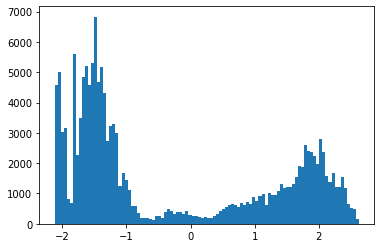

In [0]:
plt.hist(image_flat, bins = 100)

As is evident from the histogram of the image that I have flattened, the values range from -2.11 to 2.64 which is the ovrall min and max from the cell where I have calculated the min and max.

So basically the values which are outside the range of 0-1 are converted to the nearest extreme point. The values smaller than 0 are converted to 0, hence getting numerous dark spots and the values that are greater than 1 are converted to 1, hence getting a lot of 1 values which are bright spots.

In [0]:
image_copy = image.copy()

In [0]:
image_copy.shape, type(image_copy)

((224, 224, 3), numpy.ndarray)

In [0]:
# Just another way of denormalzing, inefficient one
for row in range(224):
    for col in range(224):
        for channel in range(3):
            image_copy[row][col][channel] *= std[channel]
            image_copy[row][col][channel] += mean[channel]


(array([13912.,  2748.,  3226.,  3728.,  1666.,  1784.,  1748.,  3943.,
         3192.,  5880.,  3799.,  6224.,  6899.,  4505.,  7131.,  3843.,
         4192.,  2523.,  2932.,  1487.,  1508.,   622.,   582.,   237.,
          229.,   183.,   133.,   214.,   162.,   246.,   169.,   303.,
          257.,   475.,   275.,   323.,   206.,   293.,   265.,   171.,
          260.,   198.,   358.,   283.,   393.,   174.,   287.,   173.,
          216.,   208.,   149.,   248.,   177.,   286.,   221.,   400.,
          305.,   594.,   418.,   582.,   416.,   693.,   763.,   513.,
          703.,   457.,   631.,   506.,   760.,   666.,  1108.,   718.,
         1112.,   758.,  1089.,  1071.,   822.,  1191.,   844.,  1303.,
          856.,  1346.,   850.,  1382.,   946.,  1717.,  1318.,  2430.,
         2739.,  2211.,  3785.,  2210.,  3313.,  2153.,  3359.,  1948.,
         2163.,   742.,   624.,   167.]),
 array([-1.43051144e-08,  9.96077061e-03,  1.99215561e-02,  2.98823416e-02,
         3.9843127

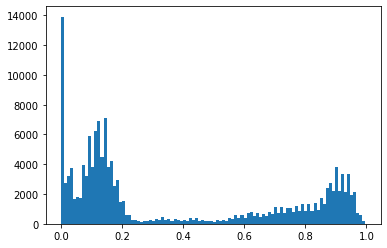

In [0]:
image_copy_flat = image_copy.flatten()
plt.hist(image_copy_flat, bins = 100)

Here the range is again converted to [0, 1].

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


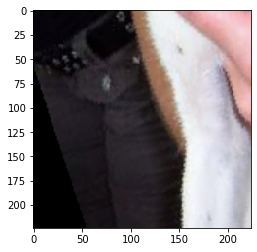

In [0]:
plt.imshow(image_copy) # Denormalized image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


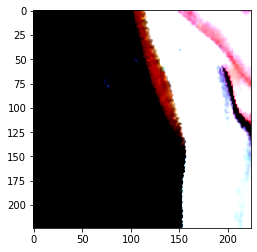

In [0]:
plt.imshow(image) # Normalized image

So the mistake that I did was to basically forget and ignore the indexing way of numpy which is to do `array[dim 1 index, dim 2 index, and so on]` and I did `array[dim 1 index][dim 2 index] [and so on]` which is the way of python arrays which inadvertently gave unexpected results.